In [1]:
import netCDF4 as nc
import os
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.basemap import Basemap
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import scipy
from scipy.spatial.distance import cdist
from statsmodels.stats.multitest import multipletests
import tqdm
import matplotlib.colors as mcolors
from helpers import process_h as helper
from helpers import visualize_h as vis_helper
import skill_metrics as sm
import pysteps
import pandas as pd

Pysteps configuration file found at: /root/.pyenv/versions/3.10.11/envs/dsproj/lib/python3.10/site-packages/pysteps/pystepsrc



In [2]:
dpi_param = 200

In [3]:
data_relative_path = os.path.join('..', 'Data')
precipitation_path = os.path.join(data_relative_path,'CMIP6','Precipitation')
future_precip_path = os.path.join(data_relative_path,'CMIP6','FuturePrecipitation')
WTIO_path = os.path.join(data_relative_path,'CMIP6','WTIO')
SEIO_path = os.path.join(data_relative_path,'CMIP6','SEIO')
CHIRPS_path = os.path.join(data_relative_path,'CHIRPS2')
SLP_path = os.path.join(data_relative_path,'CMIP6','SLP')
GPH500_path = os.path.join(data_relative_path,'CMIP6', 'GPH500')
ERA5_path = os.path.join(data_relative_path, 'ERA5')

In [4]:
precip_baseline = ((nc.Dataset(f"{CHIRPS_path}/CHIRPS_Monthly_precipitation.nc")['precip'][:])[9::12, 280:360, 800:920])[:30, :, :]

In [5]:
# Converting units needed for converting models precipitation measurements
unit_conversion = 86400 * 31
# Map latitude and longitude boundaries
bounds_middle_east_lat = [20, 40]
bounds_middle_east_lon = [20, 50]
boundaries_middle_east = bounds_middle_east_lon + bounds_middle_east_lat
bounds_general_lat = [-20, 50]
bounds_general_lon = [-10, 110]
boundaries_general = bounds_general_lon + bounds_general_lat
# A dimension we want our grid to have
dim = (16, 16)
chirps_dim = precip_baseline.shape[1], precip_baseline.shape[2]

In [6]:
options = {"interpolate": True,
           "force grid": False,
           "average": False}
options_avg = {"interpolate": True,
           "force grid": False,
           "average": True}

In [7]:
precip  = helper.collect_all_datasets(precipitation_path, 'precip', chirps_dim, unit_conversion, bounds_middle_east_lat, bounds_middle_east_lon, options_avg)
precip = {key: val[0] for key, val in precip.items()}

  8%|███████                                                                             | 2/24 [00:00<00:02,  8.54it/s]

pr_Amon_ACCESS-CM2_historical_r1i1p1f1_gn_19811016-20101016_v20191108.nc
(16, 16)
pr_Amon_CAMS-CSM1-0_historical_r1i1p1f1_gn_19811016-20101016_v20190708.nc
(18, 27)


 12%|██████████▌                                                                         | 3/24 [00:00<00:02,  9.01it/s]

pr_Amon_CanESM5-CanOE_historical_r1i1p2f1_gn_19811016-20101016_v20190429.nc
(7, 10)
pr_Amon_CMCC-CM2-HR4_historical_r1i1p1f1_gn_19811016-20101016_v20200904.nc
(21, 25)
pr_Amon_CNRM-CM6-1-HR_historical_r1i1p1f2_gr_19811016-20101016_v20191021.nc
(40, 61)


 29%|████████████████████████▌                                                           | 7/24 [00:00<00:01, 10.63it/s]

pr_Amon_E3SM-1-0_historical_r1i1p1f1_gr_19811016-20101016_v20190913.nc
(20, 30)
pr_Amon_EC-Earth3-AerChem_historical_r1i1p1f1_gr_19811016-20101016_v20200624.nc
(28, 43)
pr_Amon_FGOALS-f3-L_historical_r1i1p1f1_gr_19811016-20101016_v20190927.nc
(20, 24)


 46%|██████████████████████████████████████                                             | 11/24 [00:01<00:01, 11.72it/s]

pr_Amon_FIO-ESM-2-0_historical_r1i1p1f1_gn_19811016-20101016_v20191209.nc
(21, 25)
pr_Amon_GFDL-ESM4_historical_r1i1p1f1_gr1_19811016-20101016_v20190726.nc
(20, 24)
pr_Amon_GISS-E2-1-H_historical_r1i1p1f1_gn_19811016-20101016_v20190403.nc
(10, 12)


 54%|████████████████████████████████████████████▉                                      | 13/24 [00:01<00:01, 10.27it/s]

pr_Amon_HadGEM3-GC31-LL_historical_r1i1p1f3_gn_19811016-20101016_v20190624.nc
(16, 16)
pr_Amon_IITM-ESM_historical_r1i1p1f1_gn_19811016-20101016_v20191226.nc
(10, 16)
pr_Amon_INM-CM5-0_historical_r1i1p1f1_gr1_19811016-20101016_v20190610.nc
(14, 16)


 71%|██████████████████████████████████████████████████████████▊                        | 17/24 [00:01<00:00, 11.58it/s]

pr_Amon_IPSL-CM6A-LR_historical_r1i1p1f1_gr_19811016-20101016_v20180803.nc
(16, 13)
pr_Amon_MCM-UA-1-0_historical_r1i1p1f2_gn_19811017-20101017_v20191017.nc
(9, 8)
pr_Amon_MIROC6_historical_r1i1p1f1_gn_19811016-20101016_v20181212.nc
(15, 21)


 79%|█████████████████████████████████████████████████████████████████▋                 | 19/24 [00:01<00:00, 12.33it/s]

pr_Amon_MPI-ESM1-2-HR_historical_r1i1p1f1_gn_19811016-20101016_v20190710.nc
(22, 32)
pr_Amon_MRI-ESM2-0_historical_r1i1p1f1_gn_19811016-20101016_v20190222.nc
(18, 27)
pr_Amon_NESM3_historical_r1i1p1f1_gn_19811016-20101016_v20190630.nc
(10, 16)


 96%|███████████████████████████████████████████████████████████████████████████████▌   | 23/24 [00:02<00:00, 13.13it/s]

pr_Amon_NorESM2-MM_historical_r1i1p1f1_gn_19811016-20101016_v20191108.nc
(21, 25)
pr_Amon_SAM0-UNICON_historical_r1i1p1f1_gn_19811016-20101016_v20190323.nc
(21, 25)
pr_Amon_TaiESM1_historical_r1i1p1f1_gn_19811016-20101016_v20200623.nc
(21, 25)


100%|███████████████████████████████████████████████████████████████████████████████████| 24/24 [00:02<00:00, 11.58it/s]

pr_Amon_UKESM1-0-LL_historical_r1i1p1f2_gn_19811016-20101016_v20190406.nc
(16, 16)


In [8]:
future_precip  = helper.collect_all_datasets(future_precip_path, 'precip', chirps_dim, unit_conversion, bounds_middle_east_lat, bounds_middle_east_lon, options_avg)
future_precip = {key: val[0] for key, val in future_precip.items()}

 12%|██████████▌                                                                         | 2/16 [00:00<00:01, 13.54it/s]

pr_Amon_ACCESS-CM2_ssp585_r1i1p1f1_gn_20711016-21001016.nc
(16, 16)
pr_Amon_CanESM5-CanOE_ssp585_r1i1p2f1_gn_20711016-21001016.nc
(7, 10)
pr_Amon_CNRM-CM6-1-HR_ssp585_r1i1p1f2_gr_20711016-21001016.nc
(40, 61)


 25%|█████████████████████                                                               | 4/16 [00:00<00:01, 10.53it/s]

pr_Amon_FGOALS-f3-L_ssp585_r1i1p1f1_gr_20711016-21001016.nc
(20, 24)
pr_Amon_FIO-ESM-2-0_ssp585_r1i1p1f1_gn_20711016-21001016.nc
(21, 25)
pr_Amon_GFDL-ESM4_ssp585_r1i1p1f1_gr1_20711016-21001016.nc
(20, 24)


 38%|███████████████████████████████▌                                                    | 6/16 [00:00<00:00, 11.13it/s]

pr_Amon_HadGEM3-GC31-LL_ssp585_r1i1p1f3_gn_20711016-21001016.nc
(16, 16)


 50%|██████████████████████████████████████████                                          | 8/16 [00:00<00:00, 11.94it/s]

pr_Amon_INM-CM5-0_ssp585_r1i1p1f1_gr1_20711016-21001016.nc
(14, 16)
pr_Amon_IPSL-CM6A-LR_ssp585_r1i1p1f1_gr_20711016-21001016.nc
(16, 13)
pr_Amon_MCM-UA-1-0_ssp585_r1i1p1f2_gn_20711017-21001017.nc
(9, 8)


 62%|███████████████████████████████████████████████████▉                               | 10/16 [00:00<00:00, 11.49it/s]

pr_Amon_MIROC6_ssp585_r1i1p1f1_gn_20711016-21001016.nc
(15, 21)
pr_Amon_MRI-ESM2-0_ssp585_r1i1p1f1_gn_20711016-21001016.nc
(18, 27)


 75%|██████████████████████████████████████████████████████████████▎                    | 12/16 [00:01<00:00, 11.42it/s]

pr_Amon_NESM3_ssp585_r1i1p1f1_gn_20711016-21001016.nc
(10, 16)


 88%|████████████████████████████████████████████████████████████████████████▋          | 14/16 [00:01<00:00, 11.78it/s]

pr_Amon_NorESM2-MM_ssp585_r1i1p1f1_gn_20711016-21001016.nc
(21, 25)
pr_Amon_TaiESM1_ssp585_r1i1p1f1_gn_20711016-21001016.nc
(21, 25)


100%|███████████████████████████████████████████████████████████████████████████████████| 16/16 [00:01<00:00, 11.75it/s]

pr_Amon_UKESM1-0-LL_ssp585_r1i1p1f2_gn_20711016-21001016.nc
(16, 16)


In [9]:
precip_matrices_all = {}
for k, v in precip.items():
    if future_precip.get(k, None) is not None:
#         precip_matrices_all[k] =  (future_precip[k] - v, helper.test_means_diff_simple(future_precip[k], v, pre_avg=True))
        precip_matrices_all[k] =  future_precip[k] - v

In [10]:
Averaged_SAL_Scores = {'ACCESS-CM2': 1.5966208611348385, 'CAMS-CSM1-0': 1.8201561317357728, 'CanESM5-CanOE': 1.062963143645949, 'CMCC-CM2-HR4': 1.2820792464022668, 'CNRM-CM6-1-HR': 1.9488772243414278, 'E3SM-1-0': 1.2481610550458568, 'EC-Earth3-AerChem': 1.6534820624944757, 'FGOALS-f3-L': 1.5942783838776011, 'FIO-ESM-2-0': 1.3094631974495214, 'GFDL-ESM4': 1.4570306178844517, 'GISS-E2-1-H': 1.7190165775864685, 'HadGEM3-GC31-LL': 1.303026055977591, 'IITM-ESM': 1.670530483849614, 'INM-CM5-0': 1.717025503530009, 'IPSL-CM6A-LR': 1.1120310243827205, 'MCM-UA-1-0': 1.9382585875146756, 'MIROC6': 0.9548823382122975, 'MPI-ESM1-2-HR': 1.7593594275333242, 'MRI-ESM2-0': 1.5644942634801913, 'NESM3': 1.7643431748446026, 'NorESM2-MM': 0.7008889684598381, 'SAM0-UNICON': 1.19621300354893, 'TaiESM1': 1.4822793132154388, 'UKESM1-0-LL': 1.626857573862514}
Precipitation_SAL = {'ACCESS-CM2': 1.1654564768006268, 'CAMS-CSM1-0': 1.2016053930600235, 'CanESM5-CanOE': 1.0252285670900534, 'CMCC-CM2-HR4': 1.3371463496844775, 'CNRM-CM6-1-HR': 1.5348990703412702, 'E3SM-1-0': 1.357704895459938, 'EC-Earth3-AerChem': 0.9736252813105684, 'FGOALS-f3-L': 0.8542287385752222, 'FIO-ESM-2-0': 0.45385254691157967, 'GFDL-ESM4': 1.075653488793139, 'GISS-E2-1-H': 1.2645148647814979, 'HadGEM3-GC31-LL': 0.6574217575062237, 'IITM-ESM': 0.9844824727033171, 'INM-CM5-0': 0.7909292745219508, 'IPSL-CM6A-LR': 0.7151970814097641, 'MCM-UA-1-0': 1.3825545421620804, 'MIROC6': 1.1638740209645324, 'MPI-ESM1-2-HR': 0.654039241349797, 'MRI-ESM2-0': 1.2438281757477407, 'NESM3': 0.8192968244249242, 'NorESM2-MM': 0.6625007303302499, 'SAM0-UNICON': 0.9509273025052182, 'TaiESM1': 0.48336733239983715, 'UKESM1-0-LL': 0.46861066462830786}
Correlation_SAL = {'ACCESS-CM2': 2.070675376465694, 'CAMS-CSM1-0': 2.2994648316618544, 'CanESM5-CanOE': 0.9340131797222588, 'CMCC-CM2-HR4': 0.9054412059811311, 'CNRM-CM6-1-HR': 2.671822941359058, 'E3SM-1-0': 0.3570762319231309, 'EC-Earth3-AerChem': 1.5913626861035444, 'FGOALS-f3-L': 1.3371175546008895, 'FIO-ESM-2-0': 1.5173619079776153, 'GFDL-ESM4': 0.8662231179731172, 'GISS-E2-1-H': 1.0516367366069854, 'HadGEM3-GC31-LL': 0.6277746739520635, 'IITM-ESM': 2.476234397140066, 'INM-CM5-0': 2.806327139271427, 'IPSL-CM6A-LR': 0.8901477972249617, 'MCM-UA-1-0': np.nan, 'MIROC6': 0.7669690463977934, 'MPI-ESM1-2-HR': 2.562663841265702, 'MRI-ESM2-0': 0.7165784143466647, 'NESM3': np.nan, 'NorESM2-MM': 0.4262031711778836, 'SAM0-UNICON': 1.413104008588999, 'TaiESM1': 1.4945056319536683, 'UKESM1-0-LL': 2.5207972203146602}
DMI_Diff_Effect_on_Precipitation_SAL = {'ACCESS-CM2': 0.4881718789105451, 'CAMS-CSM1-0': 0.6181161497963382, 'CanESM5-CanOE': 1.8536568705914818, 'CMCC-CM2-HR4': 1.3803629466788945, 'CNRM-CM6-1-HR': 2.017622588500496, 'E3SM-1-0': 1.6856162059030384, 'EC-Earth3-AerChem': 1.0085098097122847, 'FGOALS-f3-L': 1.0533681985924805, 'FIO-ESM-2-0': 0.6589505570524172, 'GFDL-ESM4': 1.2167032916428124, 'GISS-E2-1-H': 0.8595375701026285, 'HadGEM3-GC31-LL': 1.095768281671726, 'IITM-ESM': 0.324505489308901, 'INM-CM5-0': 2.1511259355790466, 'IPSL-CM6A-LR': 0.7693720670914161, 'MCM-UA-1-0': 1.734886107032116, 'MIROC6': 1.2457931924934609, 'MPI-ESM1-2-HR': 0.49706882838708216, 'MRI-ESM2-0': 1.474517599425495, 'NESM3': 0.7592965880503647, 'NorESM2-MM': 0.6786532567103248, 'SAM0-UNICON': 0.5623387513528335, 'TaiESM1': 1.1900957078189545, 'UKESM1-0-LL': 1.4102723747151436}
DMI_Diff_Effect_on_MSLP_SAL = {'ACCESS-CM2': 2.058895157069502, 'CAMS-CSM1-0': 2.3809420182339065, 'CanESM5-CanOE': 0.7987452762974436, 'CMCC-CM2-HR4': 0.7926212896154029, 'CNRM-CM6-1-HR': 1.0178172460432962, 'E3SM-1-0': 2.0372042843712004, 'EC-Earth3-AerChem': 2.0602638104752935, 'FGOALS-f3-L': 2.110259577921468, 'FIO-ESM-2-0': 0.631427404706092, 'GFDL-ESM4': 1.925596137084372, 'HadGEM3-GC31-LL': 2.031705755228354, 'IITM-ESM': 2.0712398071335243, 'INM-CM5-0': 0.6157957650980622, 'MCM-UA-1-0': 2.2692737437648733, 'MIROC6': 0.6340746700908235, 'MPI-ESM1-2-HR': 2.3889349727541833, 'MRI-ESM2-0': 2.0681326662036996, 'NESM3': 2.0794977924472606, 'NorESM2-MM': 0.7255147034147578, 'SAM0-UNICON': 0.4643568101201062, 'TaiESM1': 1.0537105796653108, 'UKESM1-0-LL': 0.4528899812905726, 'GISS-E2-1-H': 2.745112611725371, 'IPSL-CM6A-LR': 2.497102368653056}
DMI_Diff_Effect_on_Z500_SAL = {'ACCESS-CM2': 1.4707894808865916, 'CanESM5-CanOE': 1.3115585323054098, 'CMCC-CM2-HR4': 1.046135724678768, 'CNRM-CM6-1-HR': 2.0473072774212873, 'E3SM-1-0': 1.5253926742465687, 'EC-Earth3-AerChem': 2.0571943291000427, 'FGOALS-f3-L': 2.0429314579643916, 'FIO-ESM-2-0': 1.4030366159784875, 'GFDL-ESM4': 1.1652236921451982, 'GISS-E2-1-H': 1.6481998282328665, 'HadGEM3-GC31-LL': 1.301618548387455, 'IITM-ESM': 2.0169302941221043, 'INM-CM5-0': 1.7459718292121882, 'IPSL-CM6A-LR': 1.1783582242978332, 'MCM-UA-1-0': 1.7498090130084698, 'MIROC6': 1.235847428564294, 'MPI-ESM1-2-HR': 1.5829233892146712, 'MRI-ESM2-0': 1.7896205284857258, 'NESM3': 1.9065540951611355, 'NorESM2-MM': 1.4910970082352104, 'SAM0-UNICON': 1.2829251502094088, 'TaiESM1': 1.6501050458898914, 'UKESM1-0-LL': 2.114337322558628}
sals = [Averaged_SAL_Scores, Precipitation_SAL, Correlation_SAL, DMI_Diff_Effect_on_Precipitation_SAL, DMI_Diff_Effect_on_MSLP_SAL, DMI_Diff_Effect_on_Z500_SAL]
all_names = ["Averaged", 'Precipitation', 'Correlation', 'DMI Diff (High-Low) Effect on Precipitation', 'DMI Diff (High-Low) Effect on MSLP', 'DMI Diff (High-Low) Effect on Z500']


In [11]:
ranked_sal = {'ACCESS-CM2': 1.5966208611348385,
 'CAMS-CSM1-0': 1.8201561317357728,
 'CanESM5-CanOE': 1.062963143645949,
 'CMCC-CM2-HR4': 1.2820792464022668,
 'CNRM-CM6-1-HR': 1.9488772243414278,
 'E3SM-1-0': 1.2481610550458568,
 'EC-Earth3-AerChem': 1.6534820624944757,
 'FGOALS-f3-L': 1.5942783838776011,
 'FIO-ESM-2-0': 1.3094631974495214,
 'GFDL-ESM4': 1.4570306178844517,
 'GISS-E2-1-H': 1.7190165775864685,
 'HadGEM3-GC31-LL': 1.303026055977591,
 'IITM-ESM': 1.670530483849614,
 'INM-CM5-0': 1.717025503530009,
 'IPSL-CM6A-LR': 1.1120310243827205,
 'MCM-UA-1-0': 1.9382585875146756,
 'MIROC6': 0.9548823382122975,
 'MPI-ESM1-2-HR': 1.7593594275333242,
 'MRI-ESM2-0': 1.5644942634801913,
 'NESM3': 1.7643431748446026,
 'NorESM2-MM': 0.7008889684598381,
 'SAM0-UNICON': 1.19621300354893,
 'TaiESM1': 1.4822793132154388,
 'UKESM1-0-LL': 1.626857573862514}
ranked_df = pd.DataFrame(ranked_sal, index=['Rank']).T
ranked_df.sort_values('Rank', inplace=True)
ranked_df_top_k_models = ranked_df.index.values.tolist()
ranked_df

,Rank
NorESM2-MM,0.700889
MIROC6,0.954882
CanESM5-CanOE,1.062963
IPSL-CM6A-LR,1.112031
SAM0-UNICON,1.196213
E3SM-1-0,1.248161
CMCC-CM2-HR4,1.282079
HadGEM3-GC31-LL,1.303026
FIO-ESM-2-0,1.309463
GFDL-ESM4,1.457031


In [12]:
precip_matrices = {}
for k, v in precip_matrices_all.items():
    if k in ranked_df_top_k_models:
        precip_matrices[k] = v

In [13]:
precip_matrices = {key: precip_matrices[key] for key in ranked_df_top_k_models if key in precip_matrices}

In [14]:
# import matplotlib.pyplot as plt
# import cartopy.crs as ccrs
# import cartopy.feature as cfeature
# import matplotlib.colors as mcolors
# import numpy as np

# fig4, axes4 = plt.subplots(4, 4, figsize=(20, 20), subplot_kw={'projection': ccrs.PlateCarree()})
# fig4.tight_layout()
# mats = list(precip_matrices.values())
# titles = list(precip_matrices.keys())

# # Collect the normalization and color map to use across all subplots
# vmin, vmax = 0, np.max([mat.max() for mat in mats])

# # Create a custom colormap that starts from the first non-zero color
# cmap = plt.get_cmap('jet')
# cmap_with_transparency = cmap(np.linspace(0, 1, cmap.N))
# # Set the first color (corresponding to 0) to be fully transparent
# cmap_with_transparency[0] = [0, 0, 0, 0]
# transparent_cmap = mcolors.ListedColormap(cmap_with_transparency)

# # Create more granular color boundaries
# color_breaks = np.round(np.linspace(vmin, vmax, 16))
# norm = mcolors.BoundaryNorm(color_breaks, transparent_cmap.N)

# heatmaps = []  # To collect all heatmap objects for the shared colorbar
# for i, (ax, key, value) in enumerate(zip(axes4.ravel(), titles, mats)):
#     # Add letter label in top-left corner
#     ax.text(0.02, 0.09, chr(65 + i), transform=ax.transAxes, fontsize=28, fontweight='bold', color="Black")
    
#     ax.set_extent(boundaries_middle_east, crs=ccrs.PlateCarree())
#     ax.add_feature(cfeature.COASTLINE)
#     ax.add_feature(cfeature.BORDERS, linestyle=':')
#     ax.add_feature(cfeature.LAND, color='whitesmoke')
    
#     # Create heatmap
#     im = ax.imshow(value, origin='lower', cmap=transparent_cmap, extent=boundaries_middle_east,
#                   transform=ccrs.PlateCarree(), interpolation='none', norm=norm)
#     heatmaps.append(im)  # Store the heatmap
    
#     # Add longitude and latitude ticks for left and bottom plots with increased font size
#     if i % 4 == 0:
#         ax.set_yticks(np.arange(20, 41, 5))
#         ax.tick_params(axis='y', labelsize=18)  # Increased tick label size
#     if i >= 20:
#         ax.set_xticks(np.arange(20, 51, 5))
#         ax.tick_params(axis='x', labelsize=18)  # Increased tick label size
    
#     ax.set_title(f"{key}", fontsize=18, fontweight='bold')

# # Create a single colorbar at the bottom of the figure
# cbar = fig4.colorbar(heatmaps[0], ax=axes4, orientation='horizontal', pad=0.08, fraction=0.046, 
#                      ticks=color_breaks[1:])  # Skip the first (zero) break
# cbar.set_label('Average Precipitation (mm/month)', fontsize=18, fontweight='bold')
# # Increase colorbar tick label size
# cbar.ax.tick_params(labelsize=18)

# fig4.suptitle('Average Precipitation Diff of Models Prediction SSP5-8.5', fontsize=24, y=1)
# plt.subplots_adjust(wspace=0.15, hspace=0.05, bottom=0.08)
# plt.savefig(f"Average Precipitation Diff of Models Prediction SSP5-8.5, {dpi_param} dpi.png", dpi=dpi_param, bbox_inches='tight')
# plt.show()

In [15]:
# for k, v in precip_matrices_all.items():
#     print(k)
#     print(f"{np.min(v)=}, {np.max(v)=}")

In [16]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib.colors as mcolors

def plot_precipitation_comparison(precip_matrices, boundaries_middle_east, title, dpi_param=300, title_base="Average Precipitation Diff of Models Prediction SSP5-8.5", 
                           figsize=(20, 20), nrows=4, ncols=4, save_fig=True):
    """
    Creates a grid of precipitation comparison plots with shared colorbar.
    
    Parameters:
    -----------
    precip_matrices : dict
        Dictionary of matrices with model names as keys and precipitation data as values
    boundaries_middle_east : list
        List of [min_lon, max_lon, min_lat, max_lat] defining the plot extent
    title : str, optional
        Main title for the plot
    dpi_param : int, optional
        DPI for saved figure
    figsize : tuple, optional
        Figure size in inches
    nrows : int, optional
        Number of rows in the subplot grid
    ncols : int, optional
        Number of columns in the subplot grid
    save_fig : bool, optional
        Whether to save the figure
        
    Returns:
    --------
    fig : matplotlib.figure.Figure
        The figure object
    axes : numpy.ndarray
        Array of subplot axes
    """

    # Create figure and axes
    fig, axes = plt.subplots(nrows, ncols, figsize=figsize, 
                             subplot_kw={'projection': ccrs.PlateCarree()})
    fig.tight_layout()
    
    # Extract data
    mats = list(precip_matrices.values())
    titles = list(precip_matrices.keys())
    
    # Collect the normalization and color map to use across all subplots
    vmin, vmax = 0, np.max([mat.max() for mat in mats])
    
    # Create a custom colormap that starts from the first non-zero color
    cmap = plt.get_cmap('jet')
    cmap_with_transparency = cmap(np.linspace(0, 1, cmap.N))
    # Set the first color (corresponding to 0) to be fully transparent
    cmap_with_transparency[0] = [0, 0, 0, 0]
    transparent_cmap = mcolors.ListedColormap(cmap_with_transparency)
    
    # Create more granular color boundaries
    color_breaks = np.round(np.linspace(vmin, vmax, 16))
    norm = mcolors.BoundaryNorm(color_breaks, transparent_cmap.N)
    
    heatmaps = []  # To collect all heatmap objects for the shared colorbar
    
    # Plot each matrix
    for i, (ax, key, value) in enumerate(zip(axes.ravel(), titles, mats)):
        # Add letter label in top-left corner
        ax.text(0.02, 0.09, chr(65 + i), transform=ax.transAxes, 
                fontsize=28, fontweight='bold', color="Black")
        
        # Set map features
        ax.set_extent(boundaries_middle_east, crs=ccrs.PlateCarree())
        ax.add_feature(cfeature.COASTLINE)
        ax.add_feature(cfeature.BORDERS, linestyle=':')
        ax.add_feature(cfeature.LAND, color='whitesmoke')
        
        # Create heatmap
        im = ax.imshow(value, origin='lower', cmap=transparent_cmap, 
                      extent=boundaries_middle_east, transform=ccrs.PlateCarree(), 
                      interpolation='none', norm=norm)
        heatmaps.append(im)  # Store the heatmap
        
        # Add longitude and latitude ticks for left and bottom plots with increased font size
        if i % ncols == 0:
            ax.set_yticks(np.arange(20, 41, 5))
            ax.tick_params(axis='y', labelsize=18)  # Increased tick label size
            
        if i >= (nrows * ncols) - ncols:
            ax.set_xticks(np.arange(20, 51, 5))
            ax.tick_params(axis='x', labelsize=18)  # Increased tick label size
        
        ax.set_title(f"{key}", fontsize=18, fontweight='bold')
    
    # Create a single colorbar at the bottom of the figure
    cbar = fig.colorbar(heatmaps[0], ax=axes, orientation='horizontal', 
                       pad=0.08, fraction=0.046, ticks=color_breaks[1:])  # Skip the first (zero) break
    cbar.set_label('Average Precipitation (mm/month)', fontsize=18, fontweight='bold')
    
    # Increase colorbar tick label size
    cbar.ax.tick_params(labelsize=18)
    
    # Set figure title and adjust spacing
    fig.suptitle(title_base + '\n' + title, fontsize=24, y=1)
    plt.subplots_adjust(wspace=0.15, hspace=0.05, bottom=0.08)
    
    # Save and show figure
    if save_fig:
        plt.savefig(f"{title_base} {title}, {dpi_param} dpi.png", dpi=dpi_param, bbox_inches='tight')
    
    return fig, axes

In [17]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib.colors as mcolors
import numpy as np

def create_combined_visualization(data_dict, boundaries, diff_range, 
                                  title, colorbar_title,
                                  discrete_colors=True, jump=5):
    """
    Creates a visualization with multiple plots in a grid layout.
    
    Args:
        data_dict (dict): Dictionary of data, first entry is baseline
        boundaries (list): Plot boundaries [lon_min, lon_max, lat_min, lat_max]
        diff_range (tuple): Force range for colorbar (vmin, vmax)
        title (str): Main title for the figure
        colorbar_title (str): Title for the colorbar
        discrete_colors (bool): Whether to use discrete color breaks or continuous colormap
        jump (int): Spacing for longitude/latitude ticks
    """

    # Create figure
    fig, axes = plt.subplots(4, 4, figsize=(20, 20), subplot_kw={'projection': ccrs.PlateCarree()})
    fig.tight_layout()

    # Prepare data
    try:
        # If order is defined somewhere in the calling scope
        mats = [data_dict[k] for k in order]
        titles = order
    except NameError:
        # Fallback if order is not defined
        mats = list(data_dict.values())
        titles = list(data_dict.keys())

    # Create colormap and normalization
    cmap = plt.get_cmap('RdBu_r').copy()
    
    if discrete_colors:
        # Ensure symmetric color breaks around zero for discrete colors
        max_abs_value = max(abs(diff_range[0]), abs(diff_range[1]))
        
        # Create symmetric breaks around zero
        n_breaks = 15  # Total number of breaks (including endpoints)
        half_breaks = (n_breaks - 1) // 2  # Number of breaks on each side of zero
        
        # Create symmetric positive and negative breaks
        pos_breaks = np.linspace(0, max_abs_value, half_breaks + 1)[1:]  # Skip zero
        neg_breaks = -pos_breaks[::-1]  # Reverse and negate to get negative breaks
        
        # Combine breaks with zero in the middle
        color_breaks = np.concatenate([
            neg_breaks, 
            [0],  # Add zero explicitly
            pos_breaks
        ])
        
        # Round to one decimal place for nicer display
        color_breaks = np.round(color_breaks, decimals=1)
        
        norm = mcolors.BoundaryNorm(color_breaks, 256)
        
        # Create a colormap with transparency near zero
        transparent_cmap = cmap(np.linspace(0, 1, 256))
        midpoint = np.linspace(0, 1, 256)
        transparent_threshold = 0.05
        transparent_cmap[(midpoint > 0.5 - transparent_threshold) & 
                         (midpoint < 0.5 + transparent_threshold), -1] = 0
        transparent_cmap = mcolors.ListedColormap(transparent_cmap)
        
        # Ticks for colorbar (skip the endpoints for cleaner display)
        cbar_ticks = color_breaks[1:-1]
    else:
        # Continuous color approach
        norm = mcolors.TwoSlopeNorm(vmin=diff_range[0], vcenter=0, vmax=diff_range[1])
        transparent_cmap = cmap
        cbar_ticks = None

    # Collect heatmap objects for colorbar
    heatmaps = []

    # Create plots
    for i, (ax, key, value) in enumerate(zip(axes.ravel(), titles, mats)):
        # Add letter label in top-left corner
        ax.text(0.02, 0.09, chr(65 + i), transform=ax.transAxes, 
                fontsize=28, fontweight='bold', color="black")
        
        ax.set_extent(boundaries, crs=ccrs.PlateCarree())
        ax.add_feature(cfeature.COASTLINE)
        ax.add_feature(cfeature.BORDERS, linestyle=':')
        ax.add_feature(cfeature.LAND, color='whitesmoke')
        
        # Create heatmap
        im = ax.imshow(value, origin='lower', cmap=transparent_cmap, extent=boundaries,
                      transform=ccrs.PlateCarree(), interpolation='none', norm=norm)
        heatmaps.append(im)
        
        # Add longitude and latitude ticks for left and bottom plots with increased font size
        if i % 4 == 0:
            ax.set_yticks(np.arange(boundaries[2], boundaries[3]+1, jump))
            ax.tick_params(axis='y', labelsize=18)
        if i >= 20:
            ax.set_xticks(np.arange(boundaries[0], boundaries[1]+1, jump))
            ax.tick_params(axis='x', labelsize=18, rotation=45)
        
        ax.set_title(f"{key}", fontsize=16)

    # Create a single colorbar at the bottom of the figure
    cbar = fig.colorbar(heatmaps[0], ax=axes, orientation='horizontal', 
                        pad=0.08, fraction=0.046, 
                        ticks=cbar_ticks)
    cbar.set_label(colorbar_title, fontsize=18, fontweight='bold')
    # Increase colorbar tick label size
    cbar.ax.tick_params(labelsize=18)

    # Add main title
    fig.suptitle(title, fontsize=24, y=1)
    
    plt.subplots_adjust(wspace=0.15, hspace=0, bottom=0.08)
    
    return fig

# Example usage:
# fig = create_combined_visualization(
#     precip_diff_dmi,  
#     boundaries_middle_east,
#     diff_range_precip=(-10, 10),
#     title="Precipitation Differences",
#     colorbar_title="Precipitation Difference (mm/day)",
#     discrete_colors=True
# )

In [18]:
diff_range_precip = vis_helper.get_diff_range(precip_matrices_all)

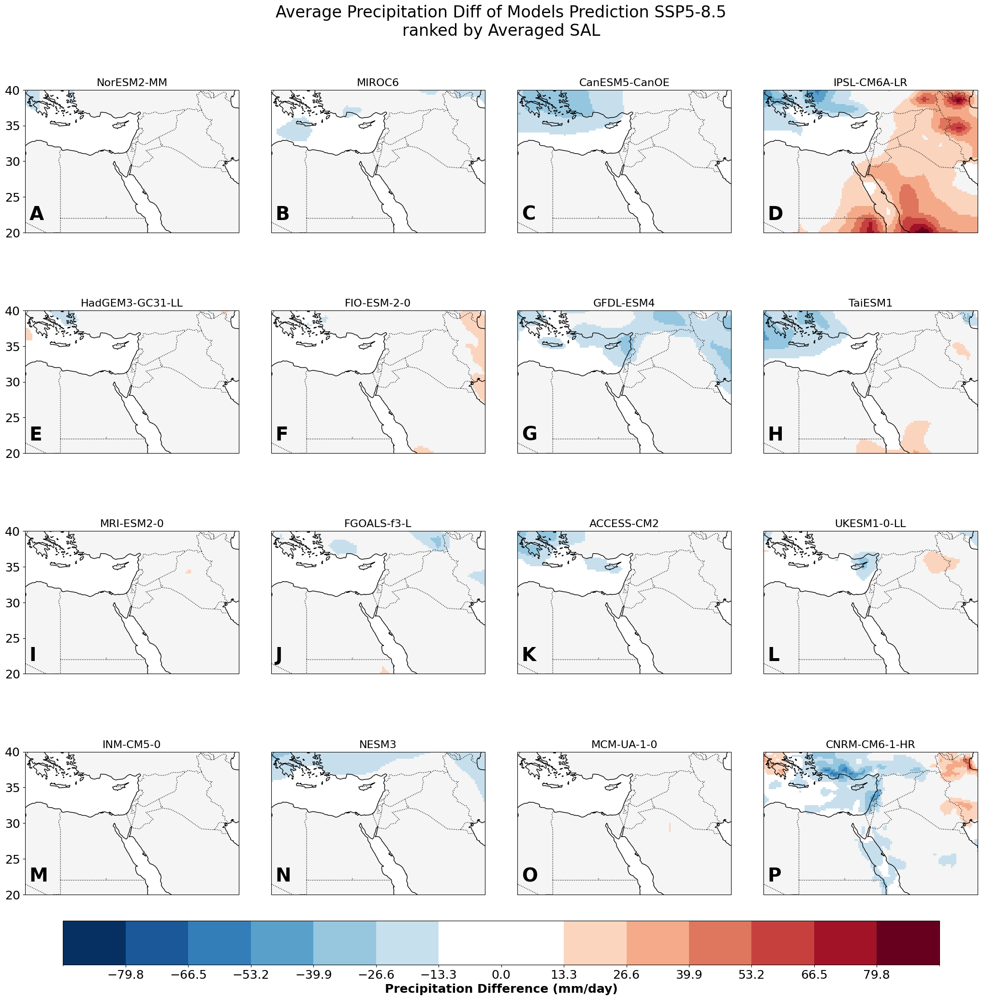

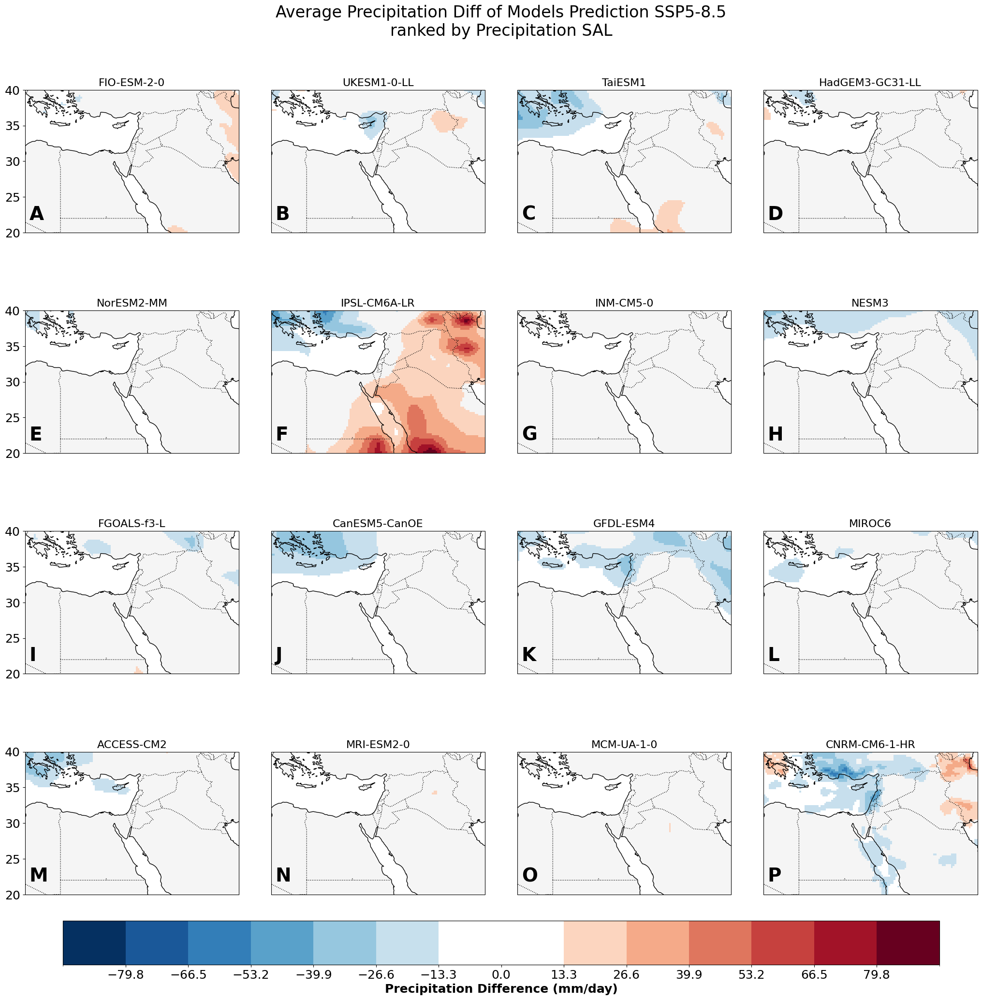

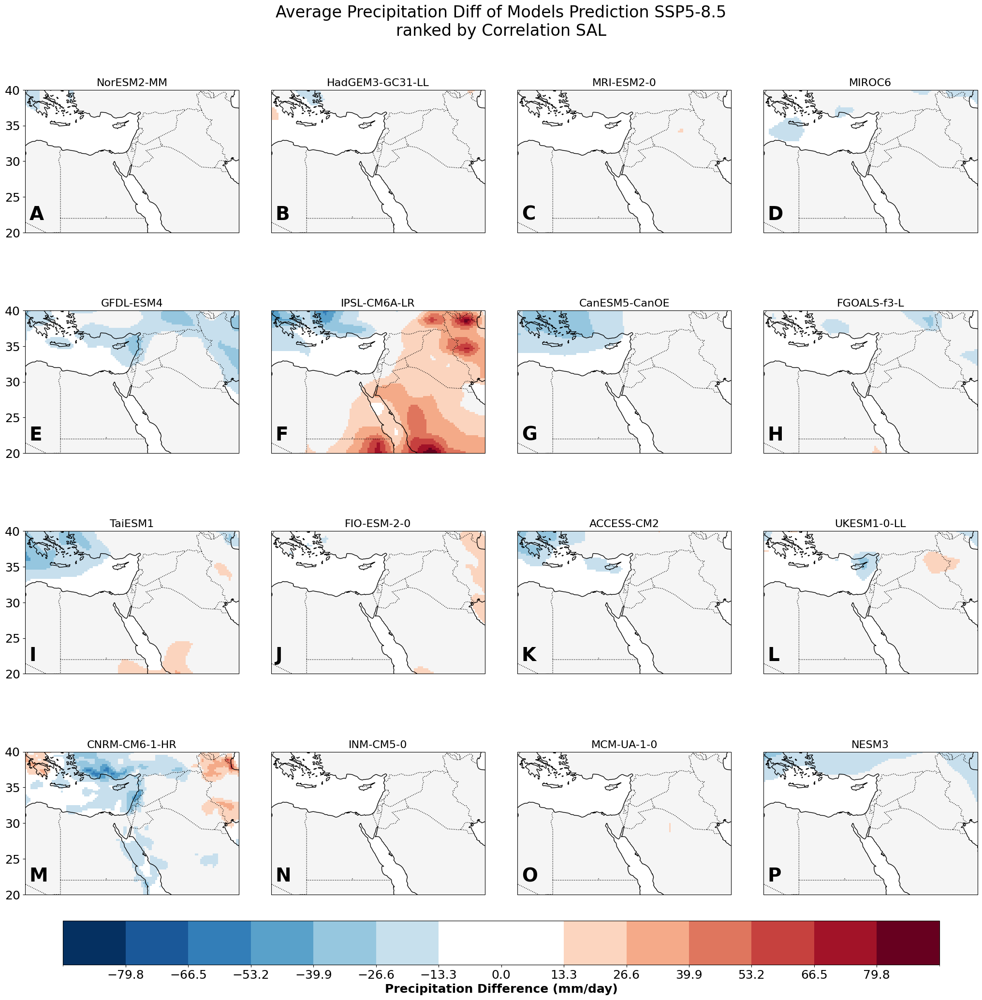

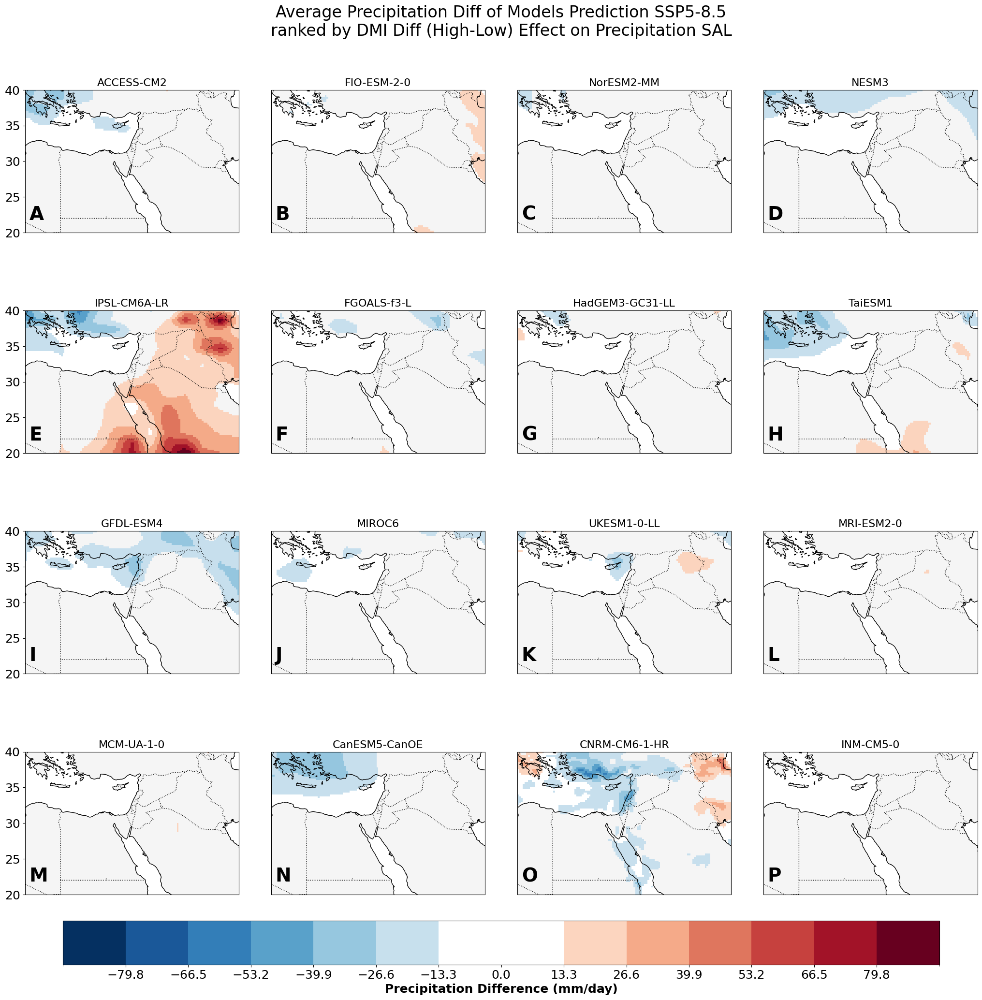

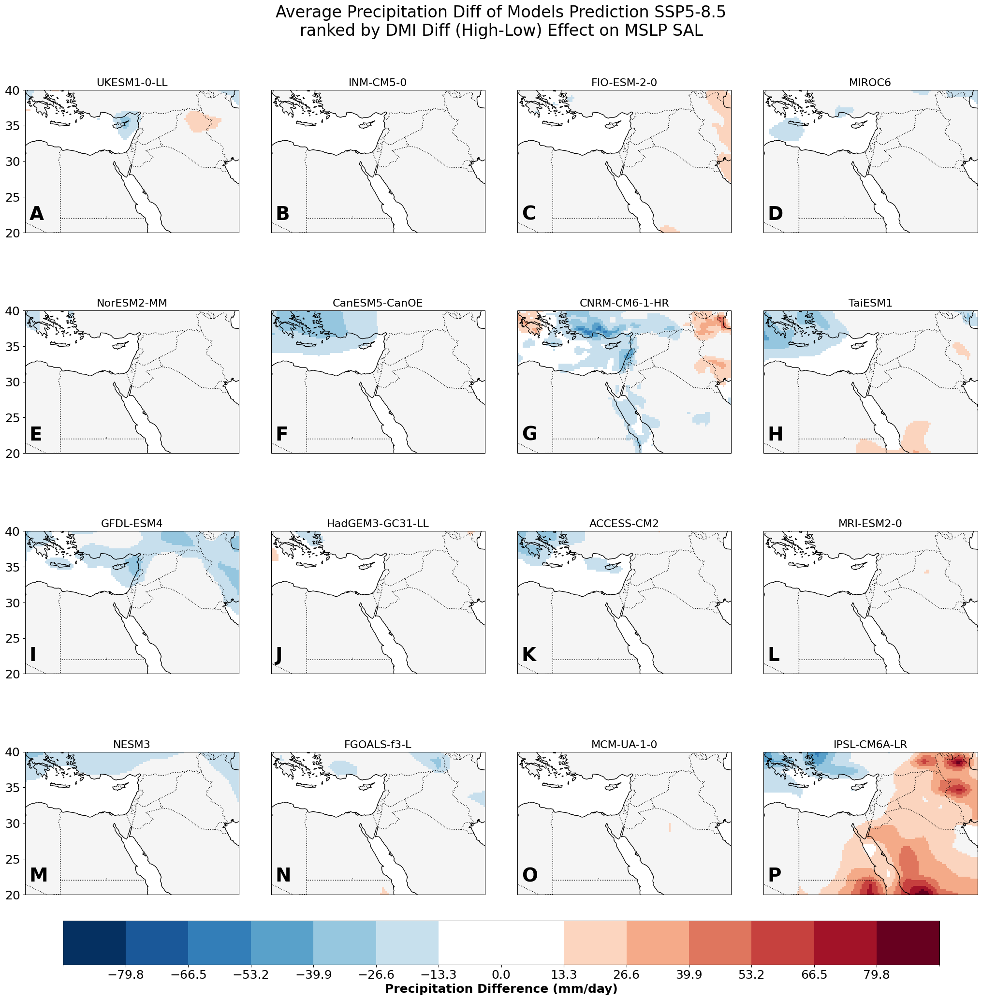

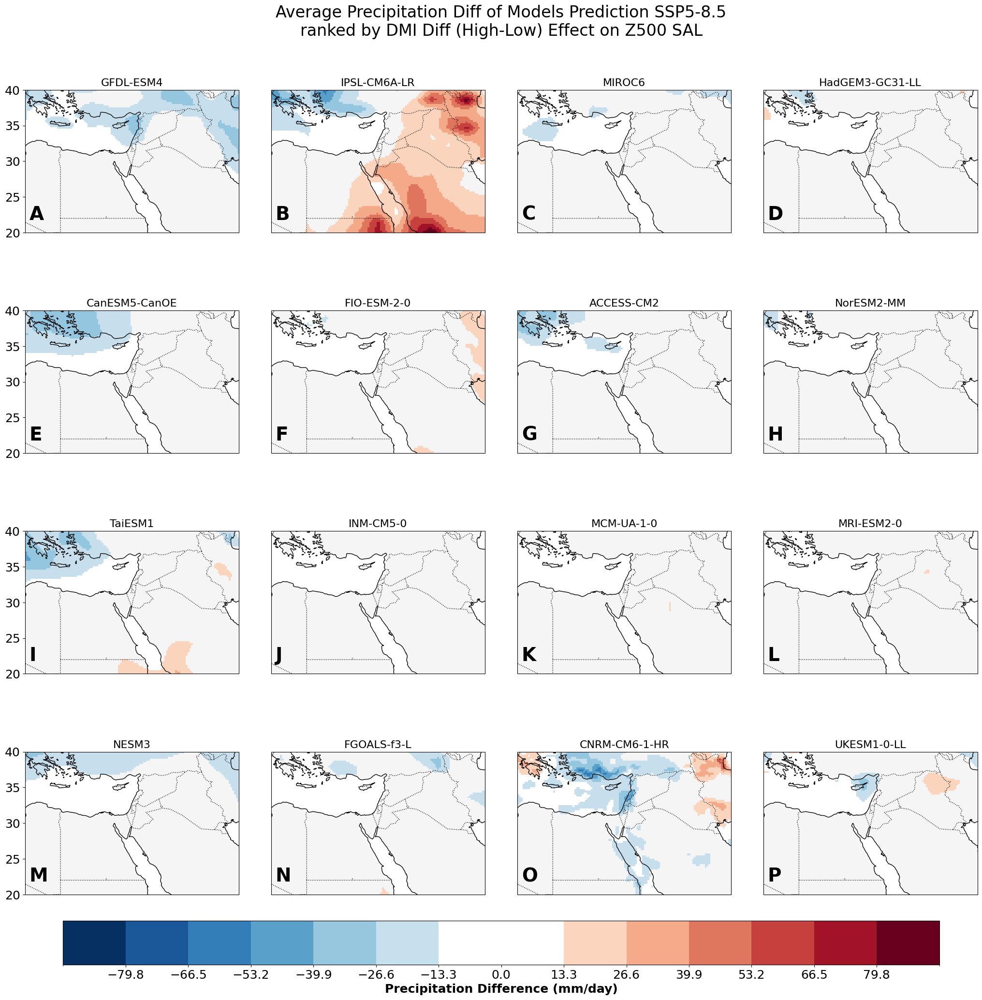

In [19]:
for i, sal in enumerate(sals):
    ranked_df = pd.DataFrame(sal, index=['Rank']).T
    ranked_df.sort_values('Rank', inplace=True)
    ranked_df_top_k_models = ranked_df.index.values.tolist()
    precip_matrices = {}
    for k, v in precip_matrices_all.items():
        if k in ranked_df_top_k_models:
            precip_matrices[k] = v
    precip_matrices = {key: precip_matrices[key] for key in ranked_df_top_k_models if key in precip_matrices}
    title = "Average Precipitation Diff of Models Prediction SSP5-8.5\n" + "ranked by " + all_names[i] + " SAL"
#     fig, axes = plot_precipitation_comparison(precip_matrices, boundaries_middle_east, title, dpi_param)
    fig = create_combined_visualization(
        precip_matrices,  
        boundaries_middle_east,
        diff_range=diff_range_precip,
        title=title,
        colorbar_title="Precipitation Difference (mm/day)",
        discrete_colors=True
    )
    plt.savefig(f"Diff of Models Prediction SSP5-8.5, ranked by {all_names[i]} SAL, {dpi_param} dpi.png", dpi=dpi_param, bbox_inches='tight')
    plt.show()

In [20]:
def create_combined_visualization_with_model_info(data_dict, boundaries, diff_range, 
                                   title, colorbar_title,
                                   top_models, bottom_models,
                                   discrete_colors=True, jump=2):
    """
    Creates a visualization with multiple plots in a grid layout and model information.
    
    Args:
        data_dict (dict): Dictionary of data with 'Top 25%' and 'Bottom 75%' keys
        boundaries (list): Plot boundaries [lon_min, lon_max, lat_min, lat_max]
        diff_range (tuple): Force range for colorbar (vmin, vmax)
        title (str): Main title for the figure
        colorbar_title (str): Title for the colorbar
        top_models (list): List of model names used in the top 25%
        bottom_models (list): List of model names used in the bottom 75%
        discrete_colors (bool): Whether to use discrete color breaks or continuous colormap
        jump (int): Spacing for longitude/latitude ticks
    """
    import matplotlib.pyplot as plt
    import matplotlib.colors as mcolors
    import cartopy.crs as ccrs
    import cartopy.feature as cfeature
    import numpy as np
    import textwrap
    
    # Set high DPI for high-resolution output
    plt.rcParams['figure.dpi'] = 300
    plt.rcParams['savefig.dpi'] = 300

    # Create figure with gridspec for flexible layout
    fig = plt.figure(figsize=(22, 16))  # Increased height to accommodate text below
    
    # Create a gridspec with appropriate ratios
    # Top row for maps (70% of height), bottom row for model info (30% of height)
    gs = fig.add_gridspec(2, 2, height_ratios=[0.7, 0.3], width_ratios=[1, 1], wspace=0.1, hspace=0.05)
    
    # Create maps with cartopy projections
    ax1 = fig.add_subplot(gs[0, 0], projection=ccrs.PlateCarree())
    ax2 = fig.add_subplot(gs[0, 1], projection=ccrs.PlateCarree())
    
    # Create text area below the maps
    ax_info = fig.add_subplot(gs[1, :])  # Span both columns
    ax_info.axis('off')  # Hide axes for text panel
    
    # Prepare axes
    axes = [ax1, ax2]
    titles = list(data_dict.keys())
    mats = list(data_dict.values())

    # Create colormap and normalization
    cmap = plt.get_cmap('RdBu_r').copy()
    
    if discrete_colors:
        # Ensure symmetric color breaks around zero for discrete colors
        max_abs_value = max(abs(diff_range[0]), abs(diff_range[1]))
        
        # Create symmetric breaks around zero
        n_breaks = 15  # Total number of breaks (including endpoints)
        half_breaks = (n_breaks - 1) // 2  # Number of breaks on each side of zero
        
        # Create symmetric positive and negative breaks
        pos_breaks = np.linspace(0, max_abs_value, half_breaks + 1)[1:]  # Skip zero
        neg_breaks = -pos_breaks[::-1]  # Reverse and negate to get negative breaks
        
        # Combine breaks with zero in the middle
        color_breaks = np.concatenate([
            neg_breaks, 
            [0],  # Add zero explicitly
            pos_breaks
        ])
        
        # Round to one decimal place for nicer display
        color_breaks = np.round(color_breaks, decimals=1)
        
        norm = mcolors.BoundaryNorm(color_breaks, 256)
        
        # Create a colormap with transparency near zero
        transparent_cmap = cmap(np.linspace(0, 1, 256))
        midpoint = np.linspace(0, 1, 256)
        transparent_threshold = 0.05
        transparent_cmap[(midpoint > 0.5 - transparent_threshold) & 
                         (midpoint < 0.5 + transparent_threshold), -1] = 0
        transparent_cmap = mcolors.ListedColormap(transparent_cmap)
        
        # Ticks for colorbar (skip the endpoints for cleaner display)
        cbar_ticks = color_breaks[1:-1]
    else:
        # Continuous color approach
        norm = mcolors.TwoSlopeNorm(vmin=diff_range[0], vcenter=0, vmax=diff_range[1])
        transparent_cmap = cmap
        cbar_ticks = None

    # Collect heatmap objects for colorbar
    heatmaps = []

    # Create map plots
    for i, (ax, key, value) in enumerate(zip(axes, titles, mats)):
        # Add letter label in top-left corner
        ax.text(0.02, 0.09, chr(65 + i), transform=ax.transAxes, 
                fontsize=24, fontweight='bold', color="black")
        
        ax.set_extent(boundaries, crs=ccrs.PlateCarree())
        ax.add_feature(cfeature.COASTLINE)
        ax.add_feature(cfeature.BORDERS, linestyle=':')
        ax.add_feature(cfeature.LAND, color='whitesmoke')
        
        # Create heatmap
        im = ax.imshow(value, origin='lower', cmap=transparent_cmap, extent=boundaries,
                      transform=ccrs.PlateCarree(), interpolation='none', norm=norm)
        heatmaps.append(im)
        
        # Add longitude and latitude ticks
        ax.set_yticks(np.arange(boundaries[2], boundaries[3]+1, jump))
        ax.tick_params(axis='y', labelsize=14)
        ax.set_xticks(np.arange(boundaries[0], boundaries[1]+1, jump))
        ax.tick_params(axis='x', labelsize=14, rotation=45)
        
        ax.set_title(f"{key}", fontsize=16, fontweight='bold')

    # Create a single colorbar below the maps
    cbar_ax = fig.add_axes([0.12, 0.35, 0.76, 0.02])  # [left, bottom, width, height]
    cbar = fig.colorbar(heatmaps[0], cax=cbar_ax, orientation='horizontal', 
                      ticks=cbar_ticks)
    cbar.set_label(colorbar_title, fontsize=14, fontweight='bold')
    cbar.ax.tick_params(labelsize=12)

    # Add main title
    fig.suptitle(title, fontsize=18, y=0.85)
    
    # Format model names in chunks for better readability
    def format_model_list(models, max_chars=100):
        text = ""
        current_line = ""
        
        for model in models:
            if len(current_line + model) > max_chars:
                text += current_line + "\n"
                current_line = model + ", "
            else:
                current_line += model + ", "
        
        if current_line:
            text += current_line.rstrip(", ")
            
        return text
    
    # Create model info text
    info_text = "MODELS USED IN AVERAGES:\n(Ordered by ranking)\n\n"
    
    # Add top models section with count
    info_text += f"Top 25% ({len(top_models)} models):\n"
    info_text += format_model_list(top_models)
    
    # Add spacer
    info_text += "\n\n"
    
    # Add bottom models section with count
    info_text += f"Bottom 75% ({len(bottom_models)} models):\n"
    info_text += format_model_list(bottom_models)
    
    # Add the text to the info panel below the colorbar
    ax_info.text(0.5, 0.9, info_text, va='top', ha='center', fontsize=16, 
                linespacing=1.3, family='monospace', transform=ax_info.transAxes)
    
    # Adjust layout
#     plt.tight_layout(rect=[0, 0, 1, 0.95])
    
    return fig

In [21]:
quant = 0.25

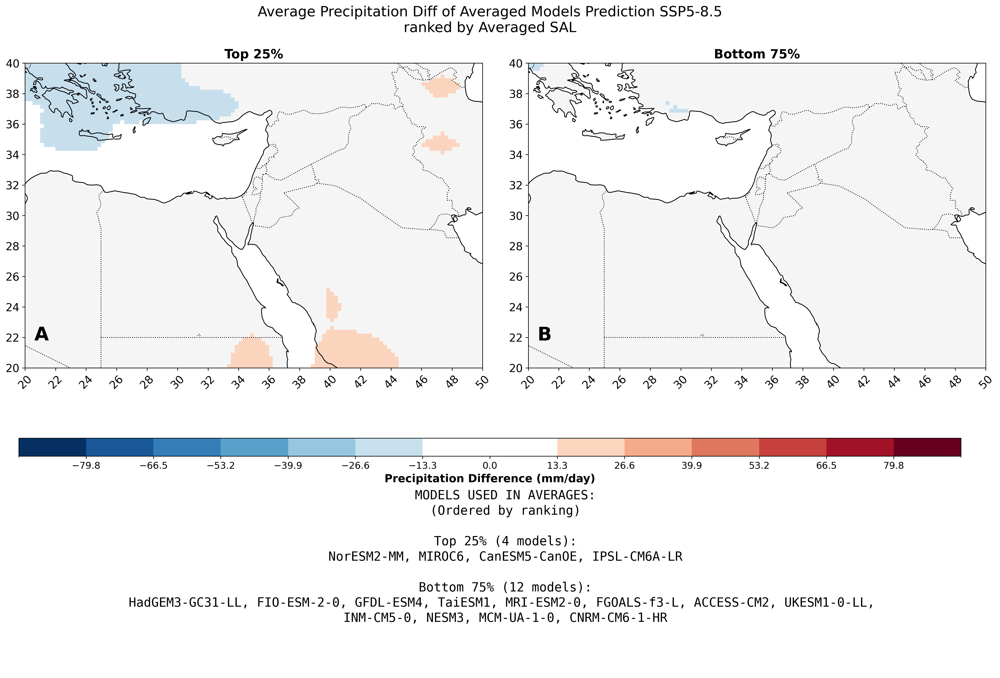

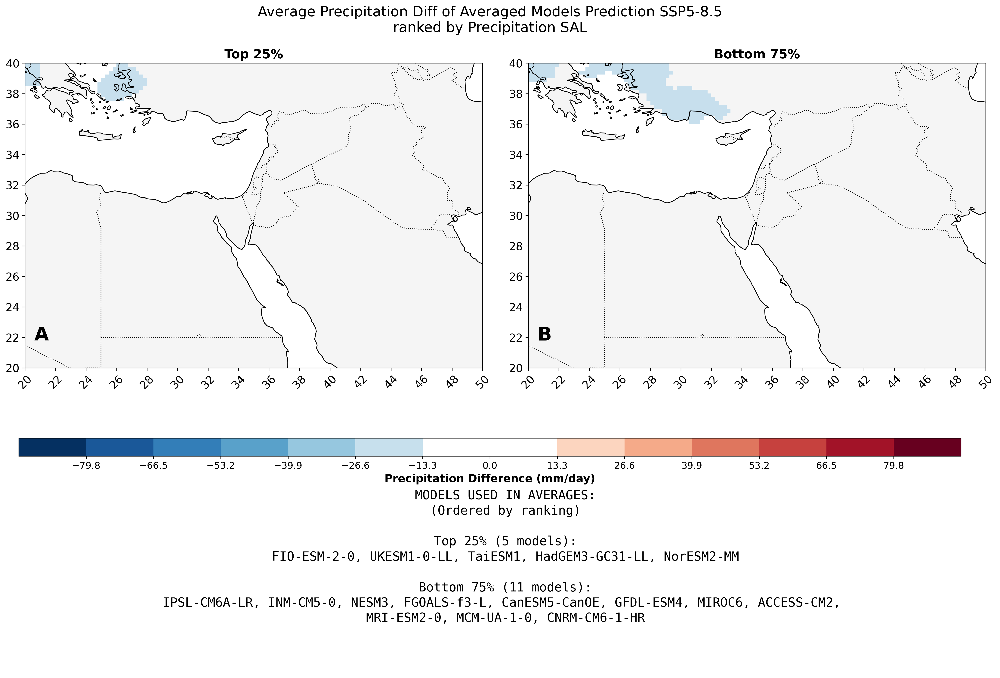

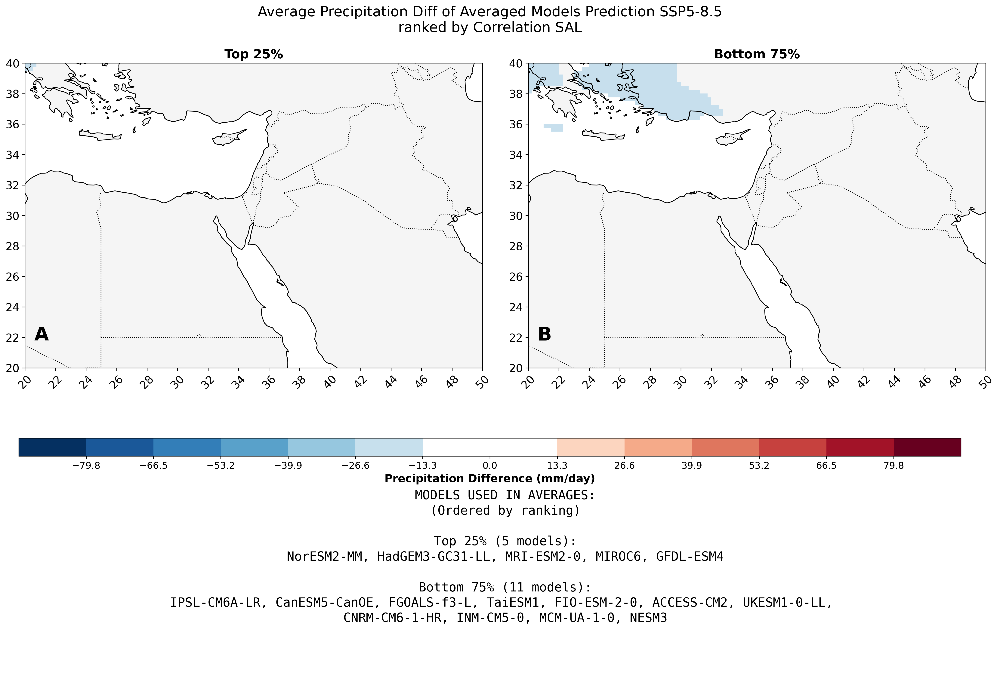

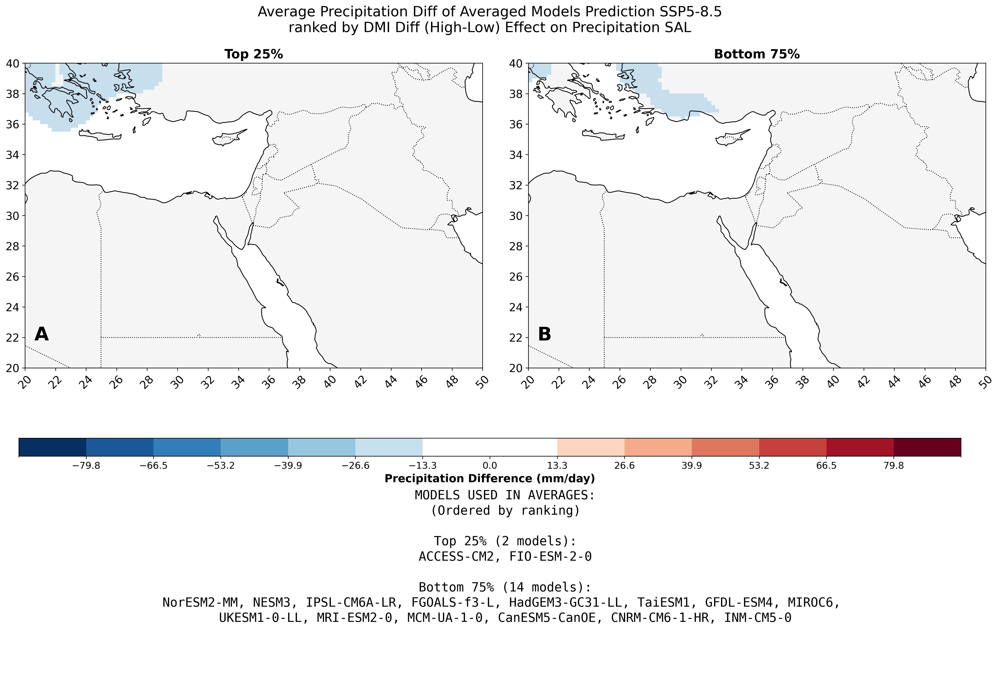

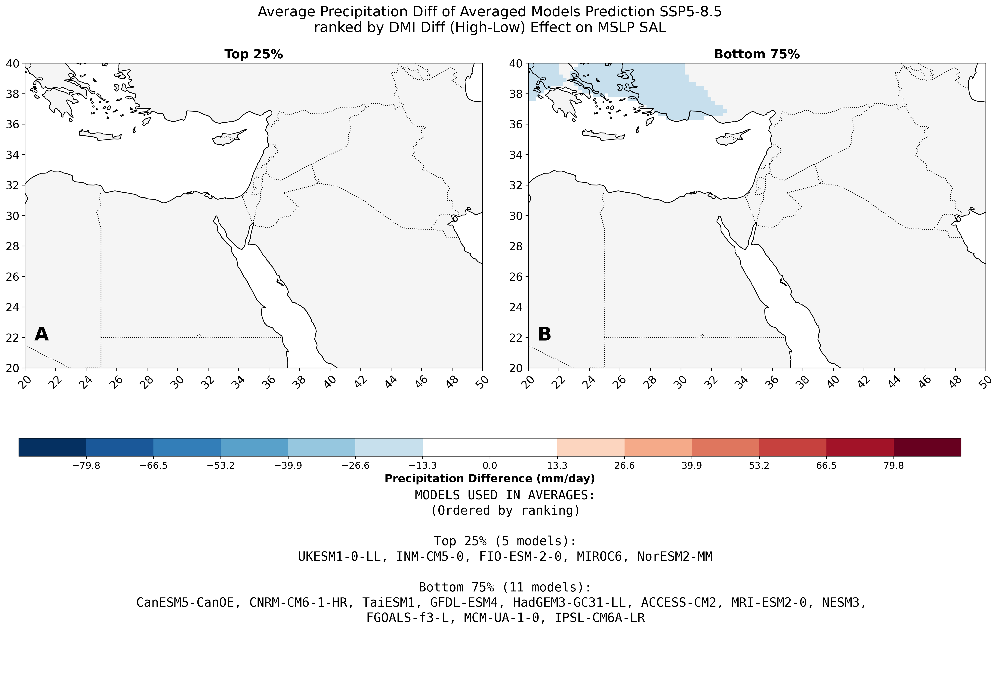

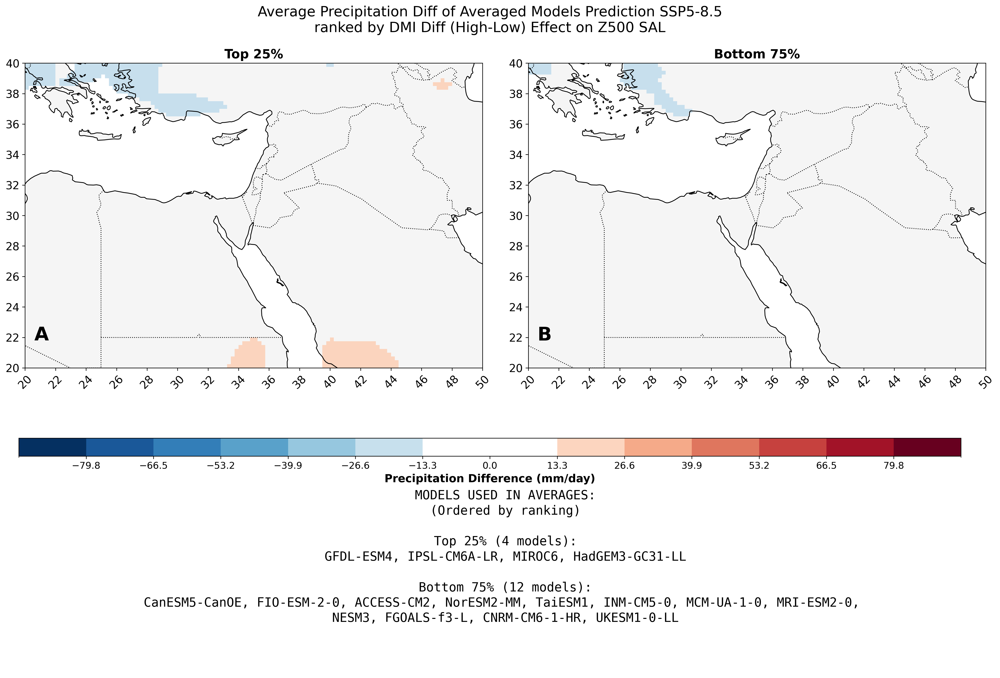

In [22]:
for i, sal in enumerate(sals):
    ranked_df = pd.DataFrame(sal, index=['Rank']).T
    ranked_df.sort_values('Rank', inplace=True)
    quantile_df = ranked_df[ranked_df['Rank'] < ranked_df.quantile(quant).iloc[0]]
    ranked_df_top_k_models = quantile_df.index.values.tolist()
    precip_rest = {}
    top_precip = {}
    for k, v in precip_matrices_all.items():
        if k in ranked_df_top_k_models:
            top_precip[k] = v
        else:
            precip_rest[k] = v
    top_precip = {key: top_precip[key] for key in ranked_df_top_k_models if key in top_precip}
    precip_rest = {key: precip_rest[key] for key in ranked_df.index if key in precip_rest}
#     top = ", ".join(top_precip.keys())
#     bottom = ", ".join(precip_rest.keys())
    top = 'Top 25%' #+ top
    bottom = 'Bottom 75%' #+ bottom
    precip_matrices = {top: np.mean([val for key, val in top_precip.items()], axis=0),
                      bottom: np.mean([val for key, val in precip_rest.items()], axis=0)}
    title = "Average Precipitation Diff of Averaged Models Prediction SSP5-8.5\n" + "ranked by " + all_names[i] + " SAL"
#     fig, axes = plot_precipitation_comparison(precip_matrices, boundaries_middle_east, title, dpi_param)
    fig = create_combined_visualization_with_model_info(       # create_combined_visualization_avg(
        precip_matrices,  
        boundaries_middle_east,
        diff_range=diff_range_precip,
        top_models=list(top_precip.keys()),
        bottom_models=list(precip_rest.keys()),
        title=title,
        colorbar_title="Precipitation Difference (mm/day)",
        discrete_colors=True
    )
    plt.savefig(f"Diff of Averaged Models Prediction SSP5-8.5, ranked by {all_names[i]} SAL, {dpi_param} dpi.png", dpi=dpi_param, bbox_inches='tight')
    plt.show()

In [23]:
def create_comprehensive_visualization(all_data, boundaries, diff_range, 
                                     title, colorbar_title,
                                     all_top_models, all_bottom_models,
                                     all_names, discrete_colors=True, jump=2):
    """
    Creates a comprehensive visualization with 6 rows (SAL metrics) and 2 columns (top vs bottom).
    
    Args:
        all_data (list): List of dictionaries, each containing 'Top 25%' and 'Bottom 75%' data
        boundaries (list): Plot boundaries [lon_min, lon_max, lat_min, lat_max]
        diff_range (tuple): Force range for colorbar (vmin, vmax)
        title (str): Main title for the figure
        colorbar_title (str): Title for the colorbar
        all_top_models (list): List of lists containing top model names for each SAL metric
        all_bottom_models (list): List of lists containing bottom model names for each SAL metric
        all_names (list): List of SAL metric names
        discrete_colors (bool): Whether to use discrete color breaks or continuous colormap
        jump (int): Spacing for longitude/latitude ticks
    """
    import matplotlib.pyplot as plt
    import matplotlib.colors as mcolors
    import cartopy.crs as ccrs
    import cartopy.feature as cfeature
    import numpy as np



    # Create figure with 6 rows and 2 columns
    fig = plt.figure(figsize=(16, 24))  # Tall figure for 6 rows
    
    # Create gridspec: 6 rows, 2 columns
    gs = fig.add_gridspec(6, 2, hspace=0.3, wspace=-0.1)
    
    # Create colormap and normalization
    cmap = plt.get_cmap('RdBu_r').copy()
    
    if discrete_colors:
        # Ensure symmetric color breaks around zero for discrete colors
        max_abs_value = max(abs(diff_range[0]), abs(diff_range[1]))
        
        # Create symmetric breaks around zero
        n_breaks = 23  # Total number of breaks (including endpoints)
        half_breaks = (n_breaks - 1) // 2  # Number of breaks on each side of zero
        
        # Create symmetric positive and negative breaks
        pos_breaks = np.linspace(0, max_abs_value, half_breaks + 1)[1:]  # Skip zero
        neg_breaks = -pos_breaks[::-1]  # Reverse and negate to get negative breaks
        
        # Combine breaks with zero in the middle
        color_breaks = np.concatenate([
            neg_breaks, 
            [0],  # Add zero explicitly
            pos_breaks
        ])
        
        # Round to one decimal place for nicer display
        color_breaks = np.round(color_breaks, decimals=1)
        
        norm = mcolors.BoundaryNorm(color_breaks, 256)
        
        # Create a colormap with transparency near zero
        transparent_cmap = cmap(np.linspace(0, 1, 256))
        midpoint = np.linspace(0, 1, 256)
        transparent_threshold = 0.05
        transparent_cmap[(midpoint > 0.5 - transparent_threshold) & 
                         (midpoint < 0.5 + transparent_threshold), -1] = 0
        transparent_cmap = mcolors.ListedColormap(transparent_cmap)
        
        # Ticks for colorbar (skip the endpoints for cleaner display)
        cbar_ticks = color_breaks[1:-1]
    else:
        # Continuous color approach
        norm = mcolors.TwoSlopeNorm(vmin=diff_range[0], vcenter=0, vmax=diff_range[1])
        transparent_cmap = cmap
        cbar_ticks = None

    # Store first heatmap for colorbar
    first_heatmap = None
    
    letter = 65
    # Create all subplots
    for row in range(6):  # 6 SAL metrics
        for col in range(2):  # 2 columns (top vs bottom)
            # Create subplot with cartopy projection
            ax = fig.add_subplot(gs[row, col], projection=ccrs.PlateCarree())
            
            # Get data for this subplot
            if col == 0:  # Top models column
                data = list(all_data[row].values())[0]  # Top 4 data
                models = all_top_models[row]
                column_title = "Top 4"
            else:  # Bottom models column
                data = list(all_data[row].values())[1]  # Bottom 4 data
                models = all_bottom_models[row]
                column_title = "Bottom 4"
            
            # Set up the map
             # Add letter label in top-left corner
            ax.text(0.02, 0.09, chr(letter), transform=ax.transAxes, 
                fontsize=28, fontweight='bold', color="black")
            ax.set_extent(boundaries, crs=ccrs.PlateCarree())
            ax.add_feature(cfeature.COASTLINE)
            ax.add_feature(cfeature.BORDERS, linestyle=':')
            ax.add_feature(cfeature.LAND, color='whitesmoke')
            
            # Create heatmap
            im = ax.imshow(data, origin='lower', cmap=transparent_cmap, extent=boundaries,
                          transform=ccrs.PlateCarree(), interpolation='none', norm=norm)
            
            # Store first heatmap for colorbar
            if first_heatmap is None:
                first_heatmap = im
            
            # Add ticks only on appropriate edges
            # X-axis ticks only on bottom row
            if row == 5:  # Bottom row
                ax.set_xticks(np.arange(boundaries[0], boundaries[1]+1, jump))
                ax.tick_params(axis='x', labelsize=12, rotation=45)
            else:
                ax.set_xticks([])
            
            # Y-axis ticks only on left column
            if col == 0:  # Left column
                ax.set_yticks(np.arange(boundaries[2], boundaries[3]+1, jump))
                ax.tick_params(axis='y', labelsize=12)
            else:
                ax.set_yticks([])
            
            # Create title with model names
            if len(models) <= 4:
                model_names = ", ".join(models)
            else:
                model_names = ", ".join(models[:3]) + f" (+ {len(models)-4} more)"
            
            # Add SAL metric name to left column titles
            if row == 0:
                subplot_title = f"{column_title}\n\n{all_names[row]} SAL\n({model_names})"
            else:
                subplot_title = f"{all_names[row]} SAL\n({model_names})"
            
            ax.set_title(subplot_title, fontsize=12, fontweight='bold', pad=10)
            letter += 1
    
    # Create a single colorbar at the bottom
    cbar_ax = fig.add_axes([0.15, 0.02, 0.7, 0.025])  # [left, bottom, width, height]
    cbar = fig.colorbar(first_heatmap, cax=cbar_ax, orientation='horizontal', 
                      ticks=cbar_ticks)
    cbar.set_label(colorbar_title, fontsize=14, fontweight='bold')
    cbar.ax.tick_params(labelsize=10)

    # Add main title
    fig.suptitle(title, fontsize=18, y=0.98)
    
    return fig


In [24]:
# Modified loop to collect all data first, then create one comprehensive plot
all_precip_matrices = []
all_top_models_list = []
all_bottom_models_list = []

for i, sal in enumerate(sals):
    print(f"Current SAL type - {all_names[i]}")
    ranked_df = pd.DataFrame(sal, index=['Rank']).T
    ranked_df = ranked_df[ranked_df.index.isin(precip_matrices_all.keys())]
    ranked_df.dropna(axis=0, inplace=True)
    ranked_df.sort_values('Rank', inplace=True)
    top = ranked_df.head(4)
    print(f"Top 4\n{top}")
    ranked_df_top_k_models = top.index.values.tolist()
    bottom = ranked_df.tail(4)
    print(f"Bottom 4\n{bottom}")
    ranked_df_bottom_k_models = bottom.index.values.tolist()
    
    bottom_precip = {}
    top_precip = {}
    for k, v in precip_matrices_all.items():
        if k in ranked_df_top_k_models:
            top_precip[k] = v
        elif k in ranked_df_bottom_k_models:
            bottom_precip[k] = v
    
    top_precip = {key: top_precip[key] for key in ranked_df_top_k_models if key in top_precip}
    bottom_precip = {key: bottom_precip[key] for key in ranked_df_bottom_k_models if key in bottom_precip}
    print(f"{top_precip.keys()=}")
    print(f"{bottom_precip.keys()=}")

    top_ = 'Top 4'
    bottom_ = 'Bottom 4'
    precip_matrices = {top_: np.mean([val for key, val in top_precip.items()], axis=0),
                      bottom_: np.mean([val for key, val in bottom_precip.items()], axis=0)}
    # Store data for comprehensive plot
    all_precip_matrices.append(precip_matrices)
    all_top_models_list.append(list(top_precip.keys()))
    all_bottom_models_list.append(list(bottom_precip.keys()))

Current SAL type - Averaged
Top 4
                   Rank
NorESM2-MM     0.700889
MIROC6         0.954882
CanESM5-CanOE  1.062963
IPSL-CM6A-LR   1.112031
Bottom 4
                   Rank
INM-CM5-0      1.717026
NESM3          1.764343
MCM-UA-1-0     1.938259
CNRM-CM6-1-HR  1.948877
top_precip.keys()=dict_keys(['NorESM2-MM', 'MIROC6', 'CanESM5-CanOE', 'IPSL-CM6A-LR'])
bottom_precip.keys()=dict_keys(['INM-CM5-0', 'NESM3', 'MCM-UA-1-0', 'CNRM-CM6-1-HR'])
Current SAL type - Precipitation
Top 4
                     Rank
FIO-ESM-2-0      0.453853
UKESM1-0-LL      0.468611
TaiESM1          0.483367
HadGEM3-GC31-LL  0.657422
Bottom 4
                   Rank
ACCESS-CM2     1.165456
MRI-ESM2-0     1.243828
MCM-UA-1-0     1.382555
CNRM-CM6-1-HR  1.534899
top_precip.keys()=dict_keys(['FIO-ESM-2-0', 'UKESM1-0-LL', 'TaiESM1', 'HadGEM3-GC31-LL'])
bottom_precip.keys()=dict_keys(['ACCESS-CM2', 'MRI-ESM2-0', 'MCM-UA-1-0', 'CNRM-CM6-1-HR'])
Current SAL type - Correlation
Top 4
                     Rank
N

In [25]:
all_diffs = np.concatenate([np.concatenate([arr.ravel() for arr in diffs.values()]) for diffs in all_precip_matrices]) 
diff_range = (np.nanmin(all_diffs), np.nanmax(all_diffs))
diff_range

(-26.958216195271234, 24.178344293539777)

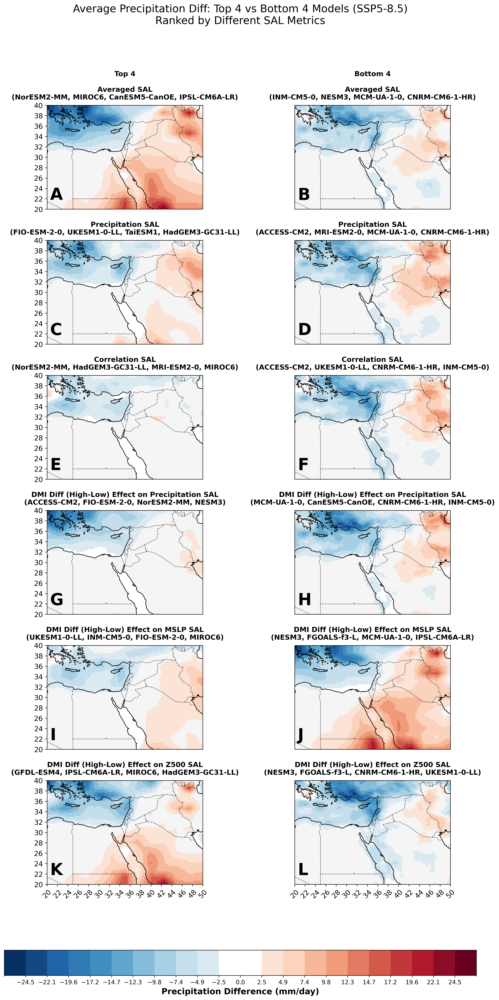

In [26]:
# Create one comprehensive visualization
title = "Average Precipitation Diff: Top 4 vs Bottom 4 Models (SSP5-8.5)\nRanked by Different SAL Metrics"

fig = create_comprehensive_visualization(
    all_precip_matrices,
    boundaries_middle_east,
    diff_range=diff_range, #diff_range_precip,
    title=title,
    colorbar_title="Precipitation Difference (mm/day)",
    all_top_models=all_top_models_list,
    all_bottom_models=all_bottom_models_list,
    all_names=all_names,
    discrete_colors=True
)

plt.savefig(f"Comprehensive_SAL_Comparison_SSP5-8.5_{dpi_param}dpi.png", 
            dpi=dpi_param, bbox_inches='tight')
plt.show()